# Compare various models with dalex ft. h2o, autokeras, catboost, lightgbm

## Health Insurance Cross Sell Prediction

In [5]:
import dalex as dx
import pandas as pd
import numpy as np
import sklearn
import tensorflow as tf
import autokeras as ak
import kerastuner as kt
import h2o
import catboost
import lightgbm

import warnings
warnings.filterwarnings('ignore')

In [7]:
# session info
pkg_dict = {}
for pkg in [dx, pd, np, sklearn, tf, ak, kt, h2o, catboost, lightgbm]:
    pkg_dict[str.split(str(pkg))[1].replace("'", "")] = pkg.__version__
pd.DataFrame(pkg_dict, index=["version"])

,dalex,pandas,numpy,sklearn,tensorflow,autokeras,kerastuner,h2o,catboost,lightgbm
version,1.0.1,1.1.3,1.19.2,0.23.2,2.4.1,1.0.12,1.0.2,3.32.1.1,0.25,3.2.0


# 1. data

data (train.csv) from: https://www.kaggle.com/anmolkumar/health-insurance-cross-sell-prediction?select=train.csv

In [8]:
data = pd.read_csv("train.csv")
data.info()
data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 381109 entries, 0 to 381108
Data columns (total 12 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    381109 non-null  int64  
 1   Gender                381109 non-null  object 
 2   Age                   381109 non-null  int64  
 3   Driving_License       381109 non-null  int64  
 4   Region_Code           381109 non-null  float64
 5   Previously_Insured    381109 non-null  int64  
 6   Vehicle_Age           381109 non-null  object 
 7   Vehicle_Damage        381109 non-null  object 
 8   Annual_Premium        381109 non-null  float64
 9   Policy_Sales_Channel  381109 non-null  float64
 10  Vintage               381109 non-null  int64  
 11  Response              381109 non-null  int64  
dtypes: float64(3), int64(6), object(3)
memory usage: 34.9+ MB


,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
0,1,Male,44,1,28.0,0,> 2 Years,Yes,40454.0,26.0,217,1
1,2,Male,76,1,3.0,0,1-2 Year,No,33536.0,26.0,183,0
2,3,Male,47,1,28.0,0,> 2 Years,Yes,38294.0,26.0,27,1
3,4,Male,21,1,11.0,1,< 1 Year,No,28619.0,152.0,203,0
4,5,Female,29,1,41.0,1,< 1 Year,No,27496.0,152.0,39,0


We have 380k observations, 11 variables and binary target. For the purpose of this comparison, let's use 10% of the data.

Clean data:

remove id, Policy_Sales_Channel, Region_Code

convert Vehicle_Age to integer

convert Gender, Vehicle_Damage to binary

investigate Driving_License, Annual_Premium

In [9]:
from sklearn.model_selection import train_test_split
data, _ = train_test_split(data, train_size=0.1, random_state=1, stratify=data.Response)

In [10]:
# drop columns
data.drop(["id", "Region_Code", "Policy_Sales_Channel"], axis=1, inplace=True)

In [11]:
# convert three columns
print(data.Vehicle_Age.unique())
data.replace({'Gender': ["Male", "Female"], 'Vehicle_Damage': ["Yes", "No"], 'Vehicle_Age': data.Vehicle_Age.unique()},
             {'Gender': [1, 0], 'Vehicle_Damage': [1, 0], 'Vehicle_Age': [2, 1, 0]},
            inplace=True)

['1-2 Year' '< 1 Year' '> 2 Years']


In [12]:
# what about Driving License in selling the vehicle insurance?
print(data.Driving_License.mean())

# 5% people bought the vehicle insurance without the Driving License
print(data.Response[data.Driving_License==0].mean())

# let's remove this variable for the clarity
# in the model we could assign: IF Driving_License == 0 THEN Response = 0
data.drop("Driving_License", axis=1, inplace=True)

0.9978220939385988
0.04819277108433735


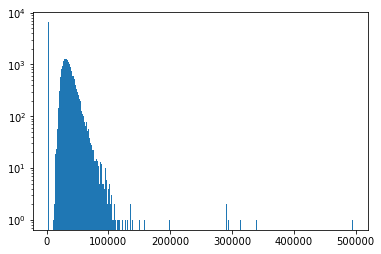

In [13]:
# what about the distribution of Annual_Premium?
import matplotlib.pyplot as plt
_ = plt.hist(data.Annual_Premium, bins='auto', log=True)
plt.show()

In [14]:
# where is the peek?
print(data.Annual_Premium.min())

# a lot of the same values
print((data.Annual_Premium==data.Annual_Premium.min()).sum())

# some very big values (0.2% above 100k)
print((data.Annual_Premium>100000).sum() / data.shape[0])

2630.0
6511
0.0019679874048806087


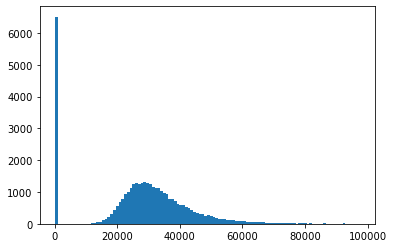

In [15]:
# let's make a variable indicating the baseline, and move the annual premium
data = data.assign(
    Annual_Premium_Baseline=lambda x: (x.Annual_Premium==data.Annual_Premium.min()).astype(int),
    Annual_Premium=data.Annual_Premium-data.Annual_Premium.min()
)

# for the sake of this comparison, let's remove heavy outliers as well
data = data[data.Annual_Premium<100000-2630]
_ = plt.hist(data.Annual_Premium, bins='auto')
plt.show()

## split

In [16]:
data.shape

(38035, 9)

In [17]:
data.Response.mean() # uneven target

0.1225713158932562

In [18]:
X, y = data.drop("Response", axis=1), data.Response
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1, stratify=y)

In [19]:
X_train.head()

,Gender,Age,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Vintage,Annual_Premium_Baseline
340370,1,50,1,2,1,0.0,34,1
47839,0,47,0,2,1,24903.0,277,0
348313,0,36,0,2,1,32059.0,66,0
150735,1,43,0,0,1,36913.0,115,0
354291,0,33,1,1,0,21246.0,235,0


# 2. Models

### baseline

In [20]:
model_baseline = lightgbm.LGBMClassifier(boosting_type="dart", n_estimators=1000, is_unbalance=True)
model_baseline.fit(X_train, y_train)
exp_baseline = dx.Explainer(model_baseline, X_test, y_test, verbose=False, label="lgbm_dart")
exp_baseline.model_performance()

,recall,precision,f1,accuracy,auc
lgbm_dart,0.817324,0.291348,0.42957,0.733831,0.836277


### H2O

In [23]:
_ = h2o.init(nthreads=-1, max_mem_size=16)
h2o.no_progress()

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
; Java HotSpot(TM) 64-Bit Server VM (build 15.0.2+7-27, mixed mode, sharing)
  Starting server from C:\Users\admin\anaconda3\Lib\site-packages\h2o\backend\bin\h2o.jar
  Ice root: C:\Users\admin\AppData\Local\Temp\tmpt5r5q_w6
  JVM stdout: C:\Users\admin\AppData\Local\Temp\tmpt5r5q_w6\h2o_admin_started_from_python.out
  JVM stderr: C:\Users\admin\AppData\Local\Temp\tmpt5r5q_w6\h2o_admin_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,01 secs
H2O_cluster_timezone:,Asia/Bangkok
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.32.1.1
H2O_cluster_version_age:,11 days
H2O_cluster_name:,H2O_from_python_admin_va5sr9
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,16 Gb
H2O_cluster_total_cores:,8
H2O_cluster_allowed_cores:,8
H2O_cluster_status:,"accepting new members, healthy"


In [24]:
df = h2o.H2OFrame(pd.concat([X_train, y_train], axis=1))
df.Response = df['Response'].asfactor()
model_h2o = h2o.estimators.H2ORandomForestEstimator(ntrees=1000,
                                                    nfolds=3,
                                                    balance_classes=True,
                                                    seed=1)
model_h2o.train(x=X_train.columns.to_list(),
                y="Response",
                training_frame=df)

In [25]:
exp_h2o = dx.Explainer(model_h2o, h2o.H2OFrame(X_test), y_test,
                       label="h2o_rf", model_type='classification', verbose=False)
exp_h2o.model_performance()

,recall,precision,f1,accuracy,auc
h2o_rf,0.081475,0.305466,0.128639,0.864655,0.824528


### Autokeras

In [26]:
from sklearn.utils import class_weight
weights = dict(enumerate(class_weight.compute_class_weight(class_weight='balanced',
                                                           classes=y_train.unique(),
                                                           y=y_train)))
weights

{0: 0.5698361965641231, 1: 4.079805491990847}

In [27]:
import logging
tf.get_logger().setLevel(logging.ERROR)
model_autokeras = ak.StructuredDataClassifier(
    max_trials=5,
    metrics=[
        tf.keras.metrics.BinaryAccuracy(name='accuracy'),
        tf.keras.metrics.Precision(name='precision'),
        tf.keras.metrics.Recall(name='recall'),
        tf.keras.metrics.AUC(name='auc')
    ],
    num_classes= 2,
    objective=kt.Objective("auc", direction="max"),
    loss=tf.keras.losses.BinaryCrossentropy(from_logits = True),
    tuner="random",
    seed=1, overwrite=True
)

model_autokeras.fit(X_train, y_train, validation_split=0.25, class_weight=weights, epochs=20, verbose=0)

In [28]:
model_keras = model_autokeras.export_model()
model_keras.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 8)]               0         
_________________________________________________________________
multi_category_encoding (Mul (None, 8)                 0         
_________________________________________________________________
normalization (Normalization (None, 8)                 17        
_________________________________________________________________
dense (Dense)                (None, 16)                144       
_________________________________________________________________
batch_normalization (BatchNo (None, 16)                64        
_________________________________________________________________
re_lu (ReLU)                 (None, 16)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 256)               4352  

In [29]:
exp_keras = dx.Explainer(model=model_keras, data=X_test, y=y_test,
                         label="autokeras", model_type="classification", verbose=False)
exp_keras.model_performance()

,recall,precision,f1,accuracy,auc
autokeras,0.922813,0.268396,0.415845,0.682091,0.832043


### Catboost

In [30]:
from sklearn.utils import class_weight
weights = dict(enumerate(class_weight.compute_class_weight(class_weight='balanced',
                                                           classes=y_train.unique(),
                                                           y=y_train)))
y_weights = y_train.replace(list(weights.keys()), list(weights.values()))
y_weights

340370    0.569836
47839     0.569836
348313    0.569836
150735    0.569836
354291    0.569836
            ...   
298505    0.569836
43816     0.569836
357934    0.569836
25826     0.569836
289619    4.079805
Name: Response, Length: 28526, dtype: float64

In [31]:
pool_train = catboost.Pool(X_train, y_train,
                           weight=y_weights)
model_catboost = catboost.CatBoostClassifier(iterations=2000)
model_catboost.fit(pool_train, verbose=False)

In [32]:
exp_catboost = dx.Explainer(model_catboost, X_test, y_test, verbose=False, label="catboost")
exp_catboost.model_performance()

,recall,precision,f1,accuracy,auc
catboost,0.86964,0.290878,0.435942,0.724051,0.841005


### Tpot - dnn add

In [48]:
#import the package
from tpot import TPOTClassifier

# define and perform the search for best model
tpot_model = TPOTClassifier(generations=5, population_size=20, cv=5, random_state=42, verbosity=2)
tpot_model.fit(X_train, y_train)

#evaluate the best model
print(tpot_model.score(X_test, y_test))


Generation 1 - Current best internal CV score: 0.8774801990493577

Generation 2 - Current best internal CV score: 0.8774801990493577

Generation 3 - Current best internal CV score: 0.8774801990493577

Generation 4 - Current best internal CV score: 0.8774801990493577

Generation 5 - Current best internal CV score: 0.8774801990493577

Best pipeline: XGBClassifier(input_matrix, learning_rate=0.01, max_depth=9, min_child_weight=7, n_estimators=100, n_jobs=1, subsample=0.45, verbosity=0)
0.8773793248501419


In [50]:
exp_tpot = dx.Explainer(tpot_model, X_test, y_test, verbose=False, label="tpot")
exp_tpot.model_performance()

,recall,precision,f1,accuracy,auc
tpot,0.0,NaN,NaN,0.877379,0.842996


### Auto ViML

In [52]:
size = int(0.7*data.shape[0])
train_df = data[:size]
test_df = data[size:]

In [53]:
from autoviml.Auto_ViML import Auto_ViML

Imported Auto_ViML version: 0.1.680. Call using:
             m, feats, trainm, testm = Auto_ViML(train, target, test,
                            sample_submission='',
                            scoring_parameter='', KMeans_Featurizer=False,
                            hyper_param='RS',feature_reduction=True,
                             Boosting_Flag='CatBoost', Binning_Flag=False,
                            Add_Poly=0, Stacking_Flag=False,Imbalanced_Flag=False,
                            verbose=1)
            
Now Auto_ViML can solve multi-label, multi-output problems. Also Auto_NLP included.
To get the latest version, perform "pip install autoviml --no-cache-dir --ignore-installed"


Imported Auto_NLP version: 0.0.45.. Call using:
     train_nlp, test_nlp, nlp_pipeline, predictions = Auto_NLP(
                nlp_column, train, test, target, score_type='balanced_accuracy',
                modeltype='Classification',top_num_features=200, verbose=0,
                build_model=True)


In [54]:
target='Response'

##############  D A T A   S E T  A N A L Y S I S  #######################
ALERT! Changing hyperparameter search to RS. Otherwise XGBoost will take too long for 10,000+ rows.
Training Set Shape = (26624, 9)
    Training Set Memory Usage = 1.93 MB
Test Set Shape = (11411, 9)
    Test Set Memory Usage = 0.83 MB
Single_Label Target: ['Response']

################ Binary_Classification VISUALIZATION Started #####################
Random shuffling the data set before training
    Using RandomizedSearchCV for Hyper Parameter Tuning. This is 3X faster than GridSearchCV...
       Class  -> Counts -> Percent
           0:   23311  ->   87.6%
           1:    3313  ->   12.4%
    Target Response is already numeric. No transformation done.
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    Number of Numeric Columns =  1
    Number of Integer-Categorical Columns =  3
    Number of String-Categorical Columns =  0
    Number of Factor

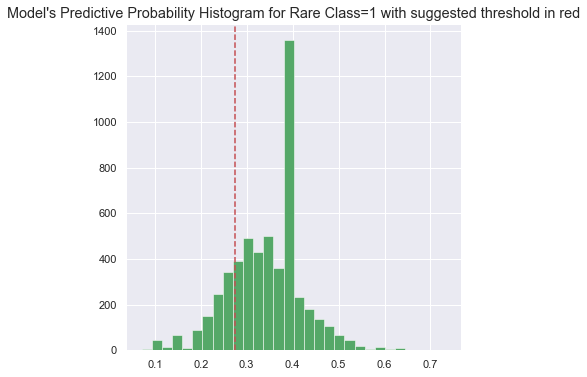

    Using threshold=0.5. However, 0.274 provides better F1=0.23 for rare class...
########################################################
XGBoost Model Prediction Results on Held Out CV Data Set:
    Regular Accuracy Score = 27.7%
Balanced Accuracy = 50.60% with Threshold = 0.50
Confusion Matrix:
[[4549  113]
 [ 639   24]]
              precision    recall  f1-score   support

           0       0.88      0.98      0.92      4662
           1       0.18      0.04      0.06       663

    accuracy                           0.86      5325
   macro avg       0.53      0.51      0.49      5325
weighted avg       0.79      0.86      0.82      5325

Balanced Accuracy = 52.09% with Threshold = 0.27
Confusion Matrix:
[[ 912 3750]
 [ 102  561]]
              precision    recall  f1-score   support

           0       0.90      0.20      0.32      4662
           1       0.13      0.85      0.23       663

    accuracy                           0.28      5325
   macro avg       0.51      0.52  

After multiple models, Ensemble Model Results:
Binary Class Model Metrics Report
#####################################################
    Accuracy          = 87.5%
    Balanced Accuracy = 50.1%
    Precision         = 25.0%
    Average Precision = 56.3%
    Recall            = 0.3%
    F1 Score          = 0.6%
#####################################################
              precision    recall  f1-score   support

           0       0.88      1.00      0.93      4662
           1       0.25      0.00      0.01       663

    accuracy                           0.87      5325
   macro avg       0.56      0.50      0.47      5325
weighted avg       0.80      0.87      0.82      5325

[[4656    6]
 [ 661    2]]
#############################################################################
Single Model is better than Ensembling Models for this data set.
Could not plot Model Evaluation Results Metrics
    Time taken for this Target (in seconds) = 7
    Binning_Flag set to False or there a

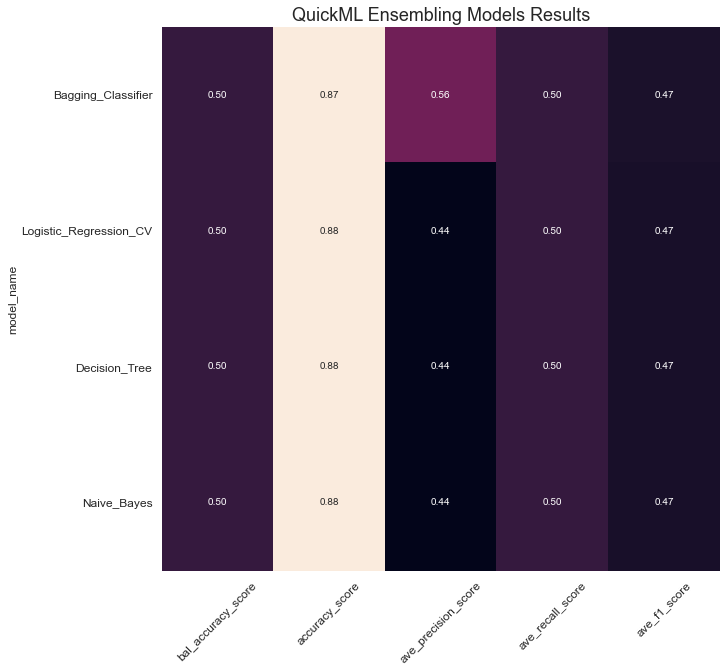

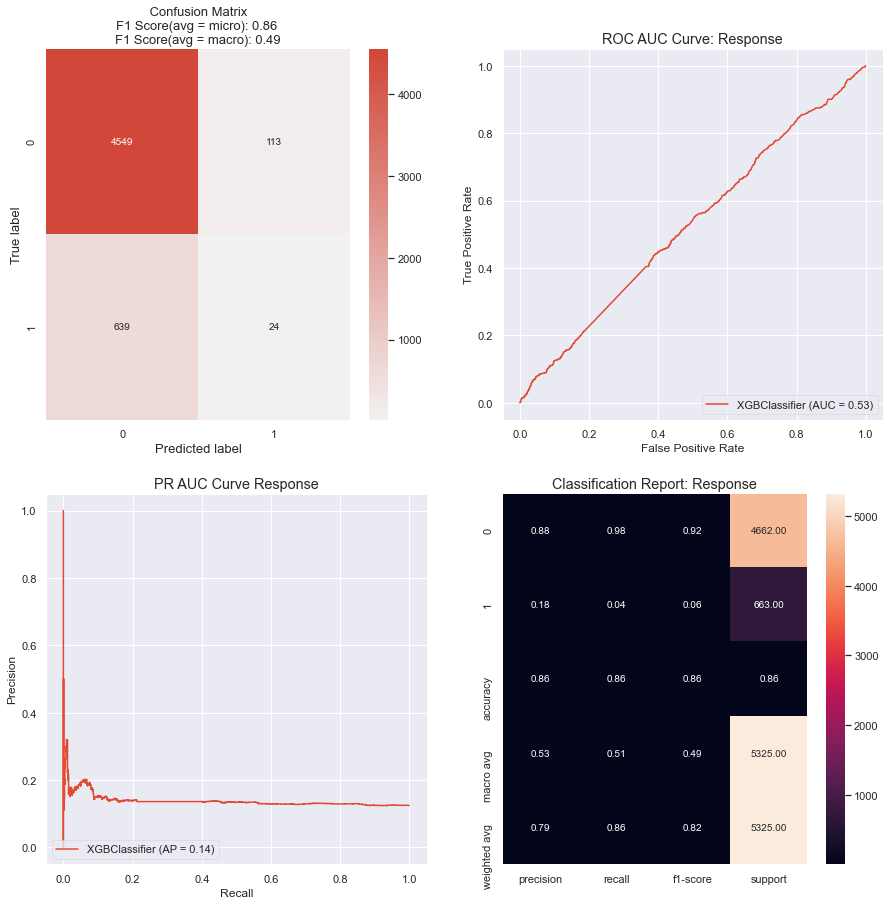

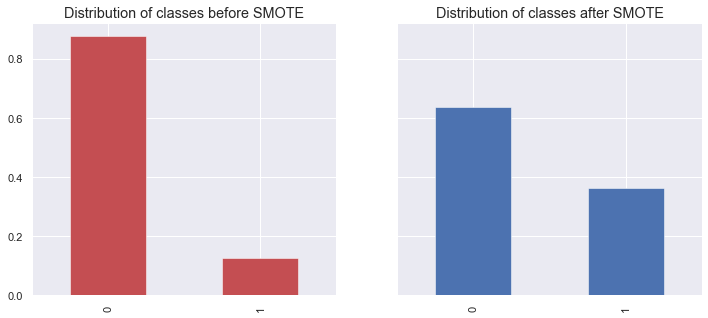

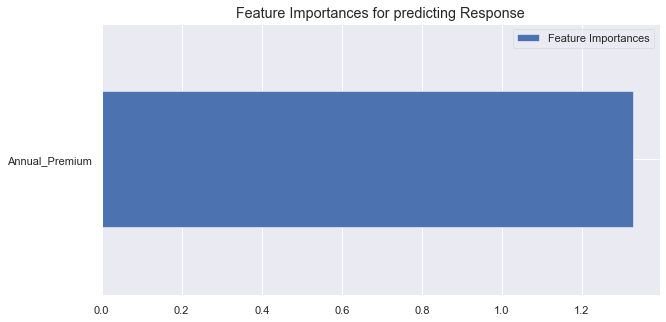

In [55]:
model, features, trainm, testm = Auto_ViML(train_df, target, test_df, sample_submission='',
                                    scoring_parameter='',
                                    hyper_param='RS',feature_reduction=True,
                                     Boosting_Flag=True,Binning_Flag=False,
                                    Add_Poly=0, Stacking_Flag=False, 
                                    Imbalanced_Flag=True, 
                                    verbose=1)

In [56]:
testm

,Annual_Premium,Response_proba_0,Response_proba_1,Response_predictions,Response_Logistic_Regression_CV_predictions,Response_Decision_Tree_predictions,Response_Naive_Bayes_predictions,Response_Bagging_Classifier_predictions,Response_XGBoost_predictions,Response_Ensembled_predictions
379487,0.00,0.86,0.14,0.00,0,0,0,0,0.00,0
158844,0.33,0.90,0.10,0.00,0,0,0,0,0.00,0
324732,0.32,0.91,0.09,0.00,0,0,0,0,0.00,0
371485,0.24,0.91,0.09,0.00,0,0,0,0,0.00,0
256550,0.34,0.89,0.11,0.00,0,0,0,0,0.00,0
...,...,...,...,...,...,...,...,...,...,...
210060,0.28,0.88,0.12,0.00,0,0,0,0,0.00,0
327751,0.41,0.83,0.17,0.00,0,0,0,0,0.00,0
4156,0.25,0.89,0.11,0.00,0,0,0,0,0.00,0
217535,0.28,0.90,0.10,0.00,0,0,0,0,0.00,0


### MLBOX

### Auto Gluon

# 3. Comparison with dalex

In [33]:
# prepare list of Explainer objects
exp_list = [exp_baseline, exp_h2o, exp_keras, exp_catboost]

In [34]:
pd.concat([exp.model_performance().result for exp in exp_list])

,recall,precision,f1,accuracy,auc
lgbm_dart,0.817324,0.291348,0.429570,0.733831,0.836277
h2o_rf,0.081475,0.305466,0.128639,0.864655,0.824528
autokeras,0.922813,0.268396,0.415845,0.682091,0.832043
catboost,0.869640,0.290878,0.435942,0.724051,0.841005


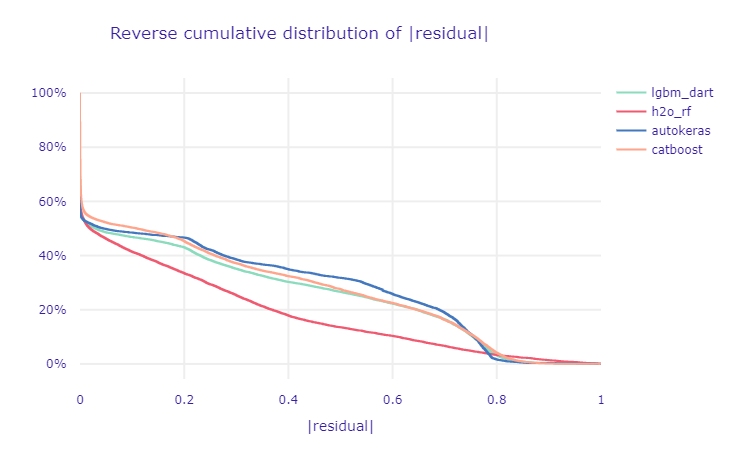

In [35]:
exp_list[0].model_performance().plot([exp.model_performance() for exp in exp_list[1:]])

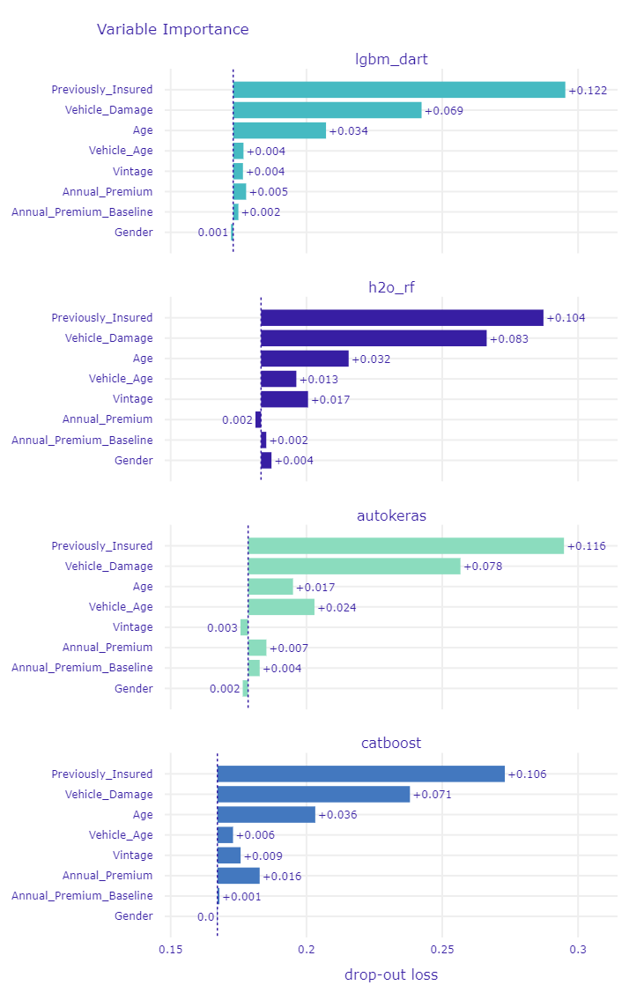

In [36]:
exp_list[0].model_parts().plot([exp.model_parts() for exp in exp_list[1:]])

Calculating ceteris paribus: 100%|███████████████████████████████████████████████████████| 8/8 [00:00<00:00, 78.55it/s]


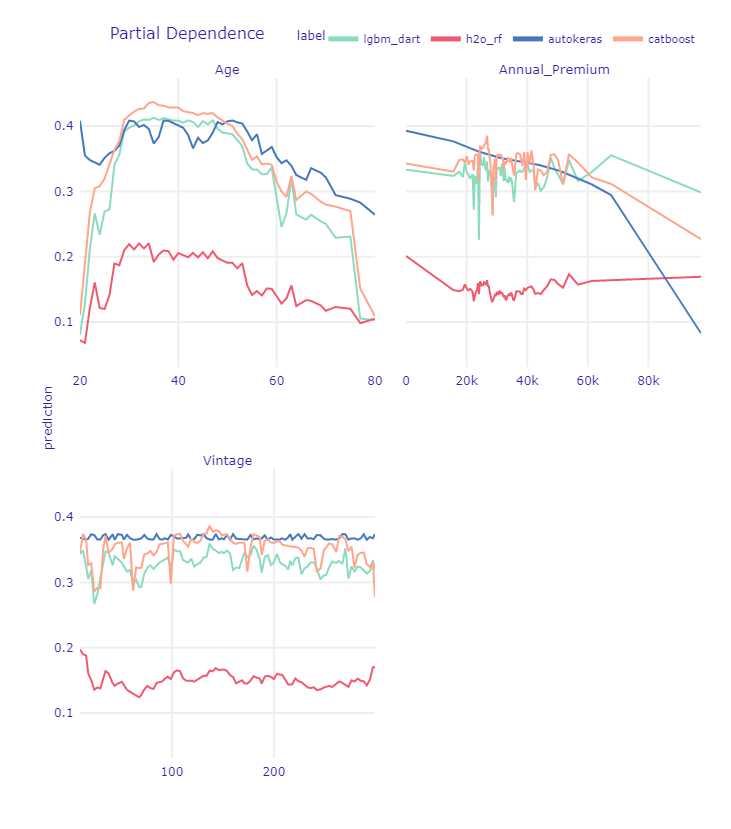

In [37]:
exp_list[0].model_profile(variable_splits_type="quantiles").plot(
    [exp.model_profile(variable_splits_type="quantiles") for exp in exp_list[1:]],
    variables=['Age', 'Annual_Premium', 'Vintage'],
    title="Partial Dependence"
)

Calculating ceteris paribus: 100%|██████████████████████████████████████████████████████| 3/3 [00:00<00:00, 130.02it/s]


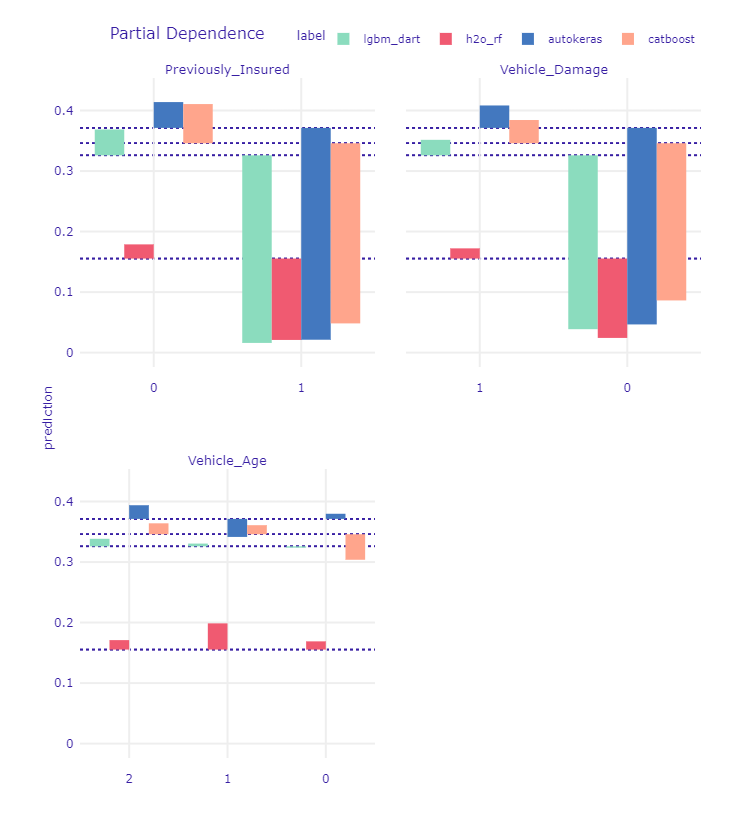

In [38]:
variables = ['Previously_Insured', 'Vehicle_Damage', 'Vehicle_Age']
variable_splits = {var: data[var].unique() for var in variables}
exp_list[0].model_profile(variable_splits=variable_splits).plot(
    [exp.model_profile(variable_splits=variable_splits) for exp in exp_list[1:]],
    variables=variables,
    title="Partial Dependence",
    geom="bars"
)

Calculating accumulated dependency: 100%|████████████████████████████████████████████████| 8/8 [00:00<00:00, 13.78it/s]


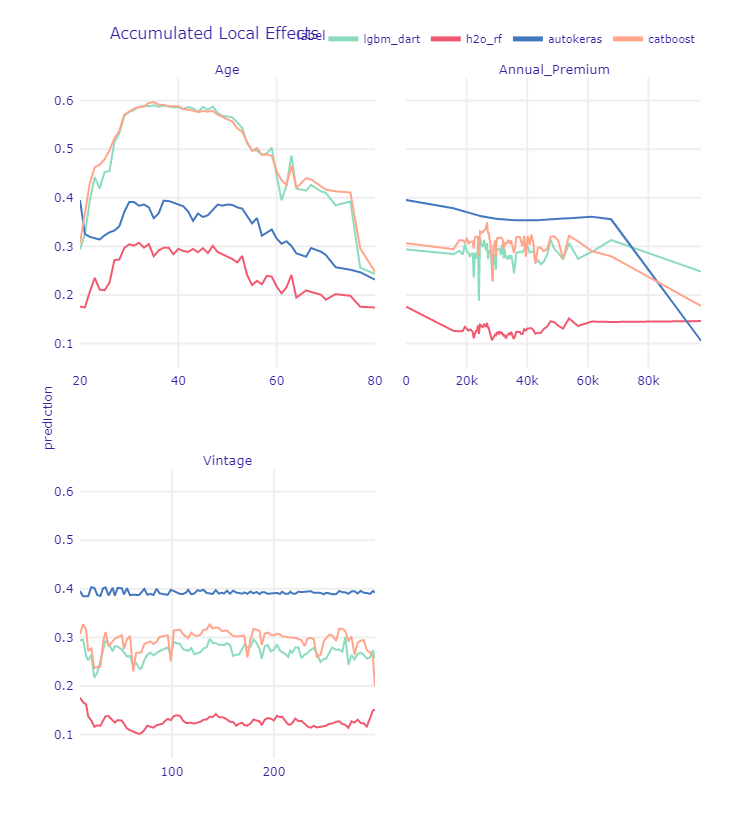

In [39]:
exp_list[0].model_profile(type='ale', variable_splits_type="quantiles").plot(
    [exp.model_profile(type='ale', variable_splits_type="quantiles") for exp in exp_list[1:]],
    variables=['Age', 'Annual_Premium', 'Vintage'], title="Accumulated Local Effects"
)

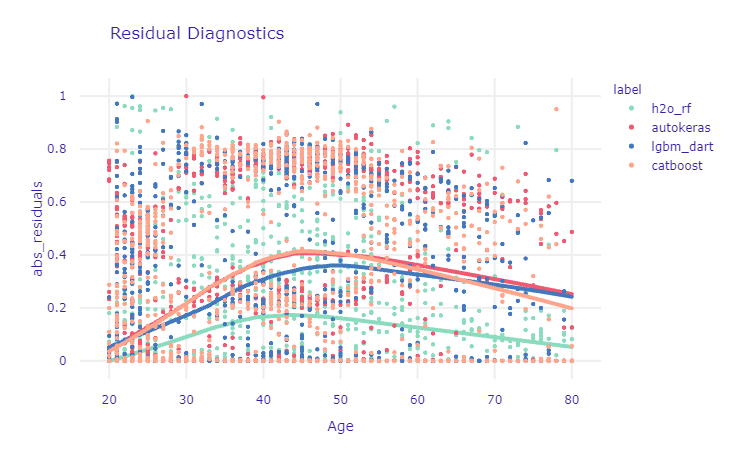

In [40]:
exp_list[0].model_diagnostics().plot([exp.model_diagnostics() for exp in exp_list[1:]],
                                     variable="Age", yvariable="abs_residuals", N=5000, marker_size=5, line_width=4)

In [41]:
new_observations = exp_baseline.data.iloc[0:10,]
pd.DataFrame({exp.label: exp.predict(new_observations) for exp in exp_list})

,lgbm_dart,h2o_rf,autokeras,catboost
0,0.781226,0.399221,7.645450e-01,0.803115
1,0.605813,0.156924,7.619261e-01,0.665040
2,0.000384,0.000115,8.779713e-05,0.002320
3,0.000040,0.000020,4.721413e-07,0.000057
4,0.000587,0.000023,8.340297e-05,0.001277
5,0.000079,0.000026,7.954391e-05,0.002021
6,0.000211,0.000023,1.113369e-04,0.000947
7,0.772047,0.295621,7.393036e-01,0.727939
8,0.000110,0.000144,2.012119e-05,0.000718
9,0.488828,0.266292,5.613983e-01,0.564415


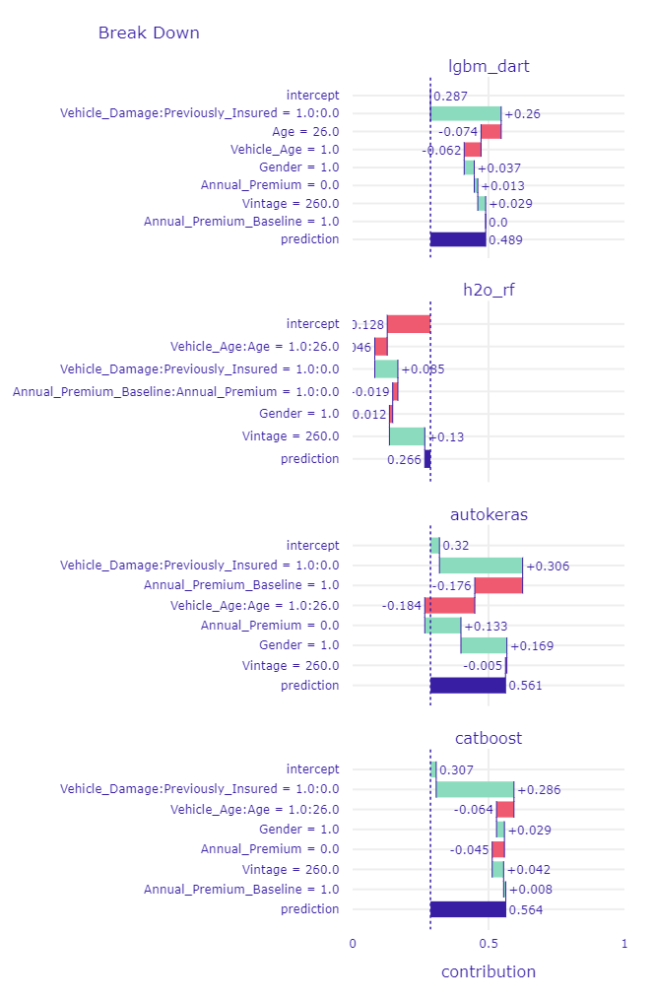

In [42]:
new_observation = exp_baseline.data.iloc[[9]]
exp_list[0].predict_parts(new_observation, label=exp_list[0].label).plot(
    [exp.predict_parts(new_observation, label=exp.label) for exp in exp_list[1:]],
    min_max=[0, 1]
)

Calculating ceteris paribus: 100%|██████████████████████████████████████████████████████| 8/8 [00:00<00:00, 119.52it/s]


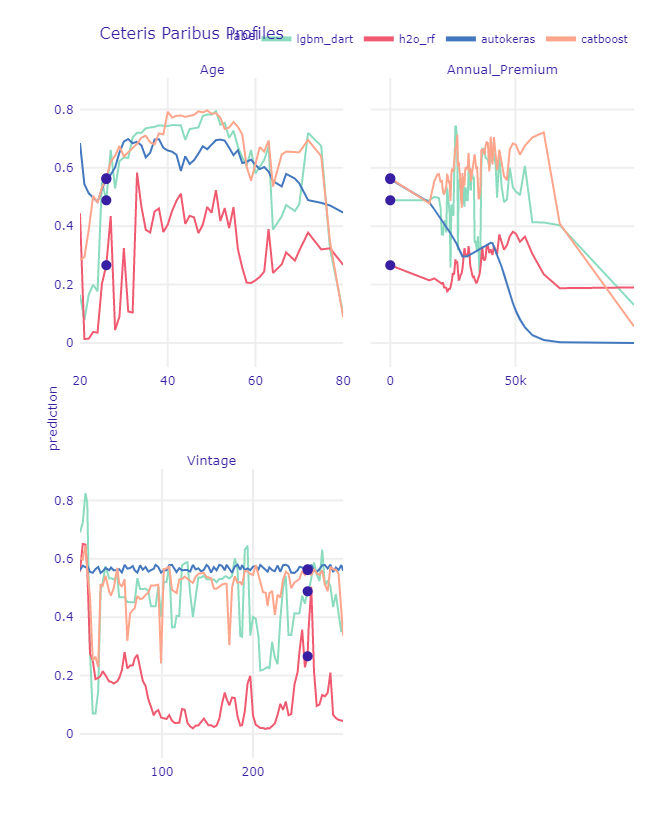

In [43]:
new_observation = exp_baseline.data.iloc[[9]]
exp_list[0].predict_profile(new_observation, variable_splits_type="quantiles", label=exp_list[0].label).plot(
    [exp.predict_profile(new_observation, variable_splits_type="quantiles", label=exp.label) for exp in exp_list[1:]],
    variables=['Age', 'Annual_Premium', 'Vintage']
)

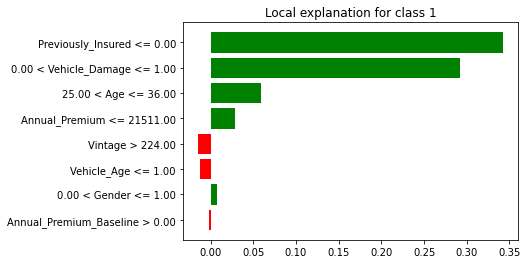

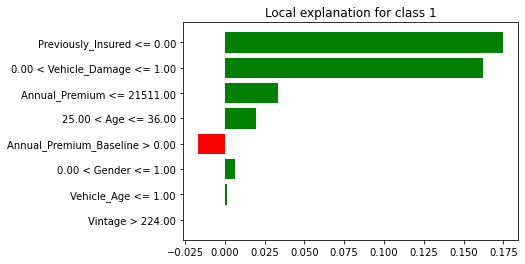

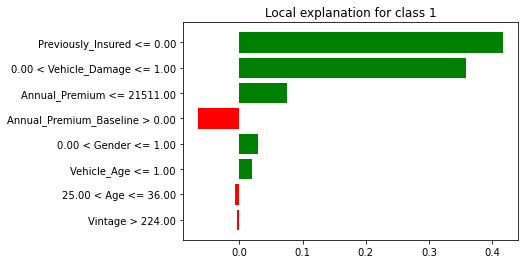

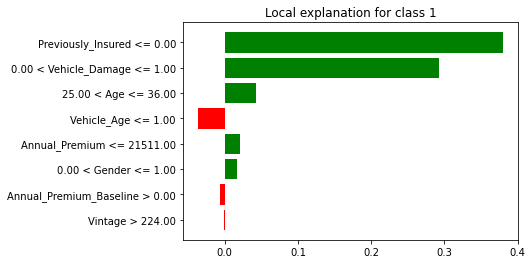

In [44]:
new_observation = exp_baseline.data.iloc[[9]]
for exp in exp_list:
    exp.predict_surrogate(new_observation).plot()